# Валидация на отложеннной скважине

In [1]:
import os
import sys
import glob

sys.path.insert(0, os.path.join("..", "..", ".."))

import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import PIL
from PIL import Image

from well_logs import CoreBatch, CoreIndex
from well_logs.batchflow import Dataset, Pipeline, B, V, FilesIndex
from well_logs.batchflow.models.torch import ResNet18
from utils import *

Загрузим разметку для отложенной скважины

In [2]:
PATH = '/notebooks/data/test_dataset/*'

index = CoreIndex(path=os.path.join(PATH, 'samples_dl/*.png'))

## Предобработка

In [3]:
df = read_annotation(PATH)

In [4]:
index = index.create_subset(np.intersect1d(df.index.values, index.indices))
ds = Dataset(index, CoreBatch)

In [5]:
SHAPE = (2, 400, 150)

In [6]:
bounds = get_bounds(PATH)

In [7]:
load_ppl = (Pipeline()
    .load(grayscale=True, df=df)
    .normalize(bounds=bounds)
    .fix_shape()
    .resize(size=(SHAPE[2], None), src='dl', dst='dl')
    .resize(size=(SHAPE[2], None), src='uv', dst='uv')
    .mirror_padding((SHAPE[2], SHAPE[1]))
)

# Валидация

In [8]:
test_template = (Pipeline()
    .to_array(src='uv', dst='uv', channels='first')
    .to_array(src='dl', dst='dl', channels='first')
    .crop(SHAPE[1:], 200, dst=('dl_crops', 'uv_crops', 'labels_crops'))
    .init_model('dynamic', ResNet18, 'model', config={
                    'device': 'gpu:2', 'load/path': 'resnet16.torch'
                })
    .init_variable('loss', init_on_each_run=list)
    .call(make_data, save_to=(B('crops_conc'), B('labels_crops_conc')))
    .init_variable('proba', init_on_each_run=None)
    .init_variable('metrics', init_on_each_run=None)
    .predict_model('model', B('crops_conc'), targets=B('labels_crops_conc'), fetches='proba',
                 save_to=B('proba', mode='w'))
    .call(assemble, save_to=B('proba', mode='w'))
    .gather_metrics('class', targets=B('labels'), predictions=B('proba'),
                            fmt='proba', axis=-1, save_to=V('metrics', mode='u'), threshold=0.5)
    .init_variable('stat', init_on_each_run=list)
    .update_variable('stat', (B('dl'), B('uv'), B('proba'), B('labels')), mode='a')
    .run(
        batch_size=8,
        n_epochs=1,
        shuffle=False,
        drop_last=False,
        lazy=True,
        bar=True
    )
)

In [9]:
test_ppl = (load_ppl + test_template) << ds

In [10]:
test_ppl.reset_iter()
test_ppl.run()

 99%|█████████▊| 69/70 [00:25<00:00,  3.04it/s]


In [11]:
metrics = test_ppl.get_variable('metrics')
print(metrics._confusion_matrix)

for m in ['specificity', 'sensitivity', 'accuracy']:
    print(m, ':', metrics.evaluate(m))

[[[490  16]
  [ 38   9]]]
specificity : 0.928030303030303
sensitivity : 0.36
accuracy : 0.9023508137432188


Как мы видим, модель ошибается и часто относит небракованные пары к бракованным. Рассмотрим примеры изображений, на которых происходят ошибки.

# False negative

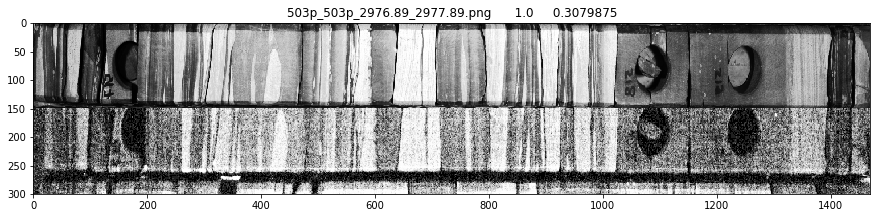

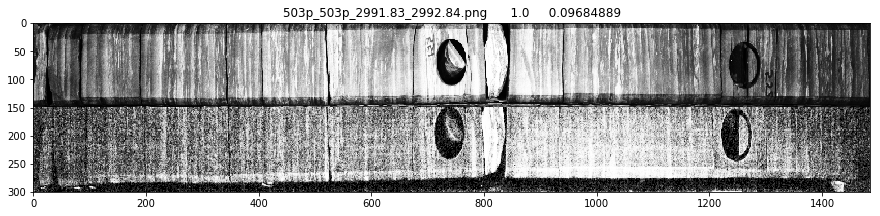

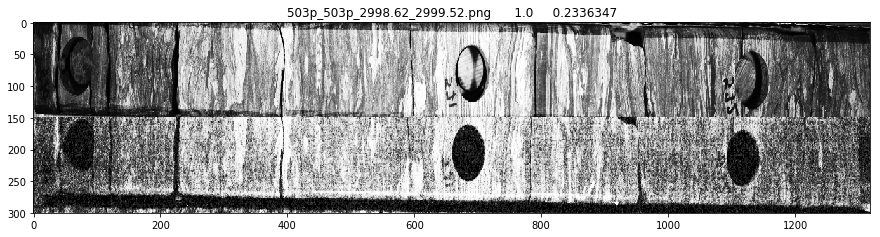

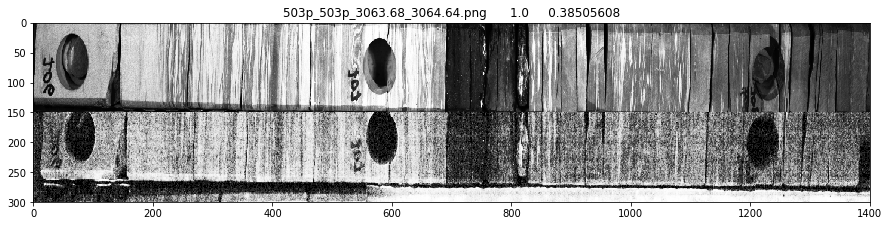

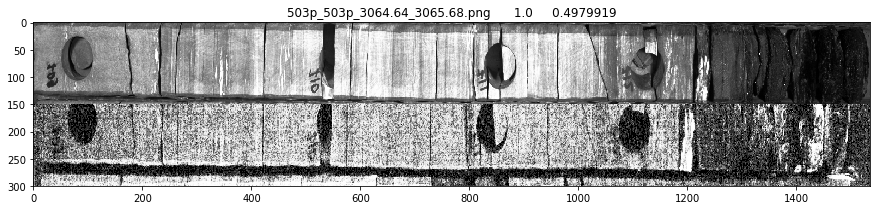

...

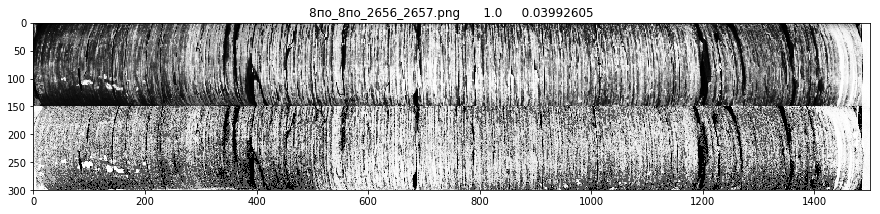

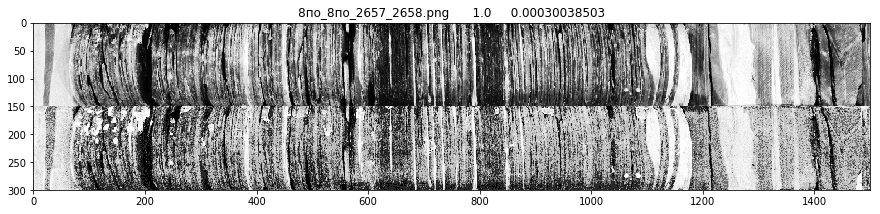

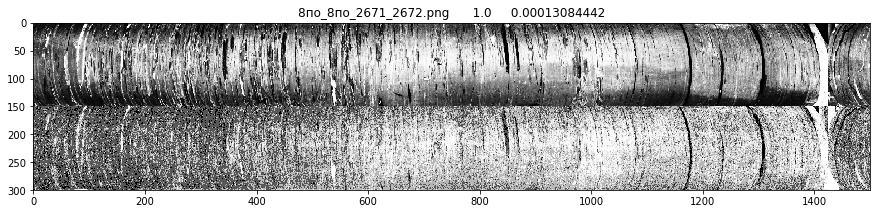

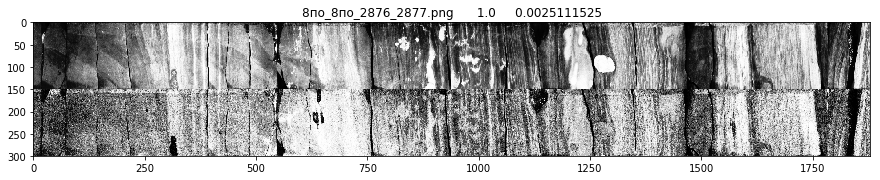

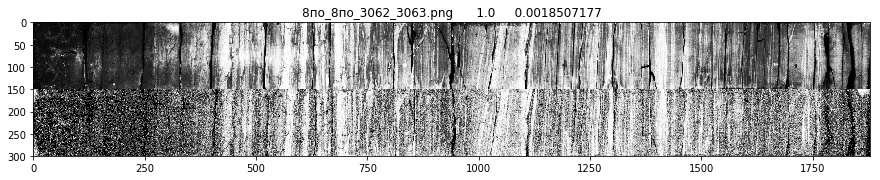

In [12]:
plot_images_predictions(test_ppl, 'fn', n_images=20)

# False positive

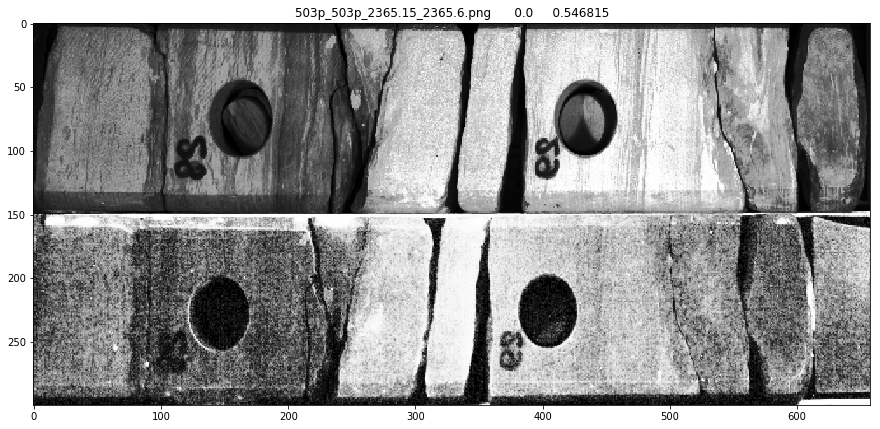

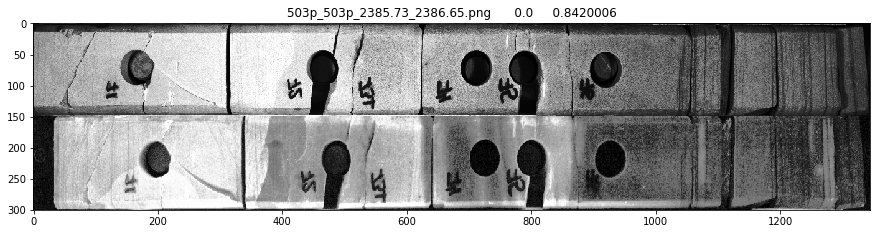

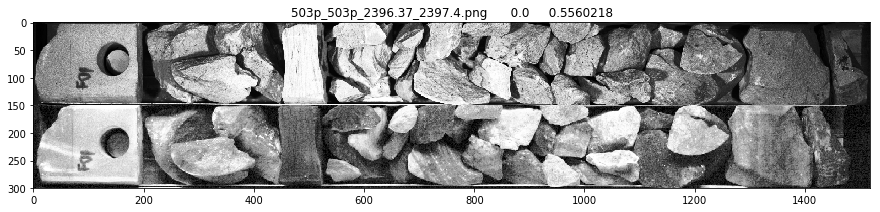

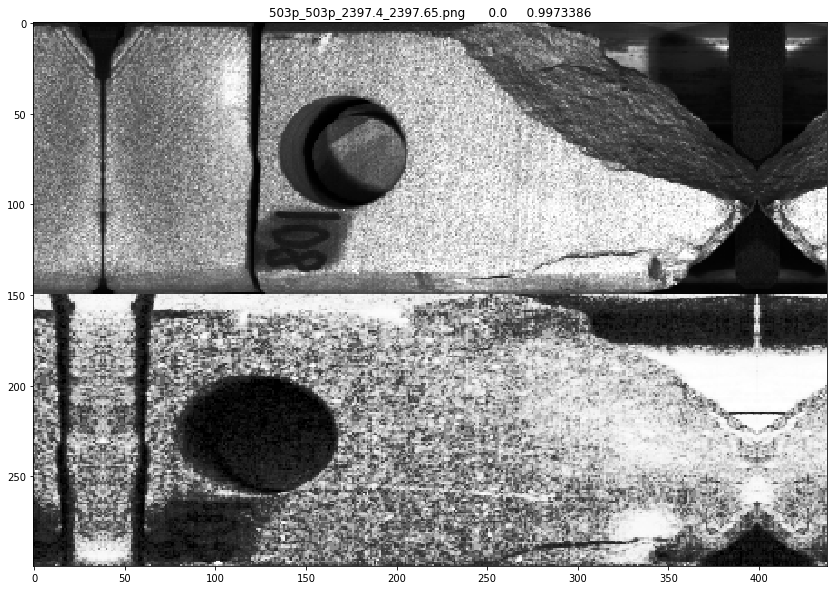

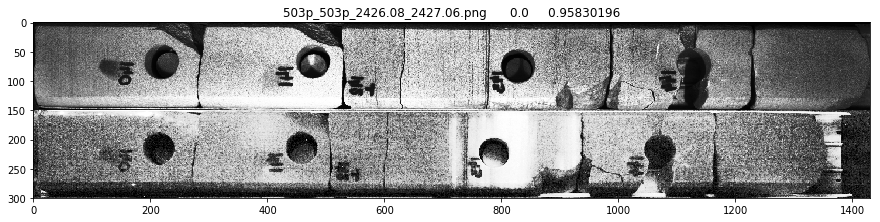

...

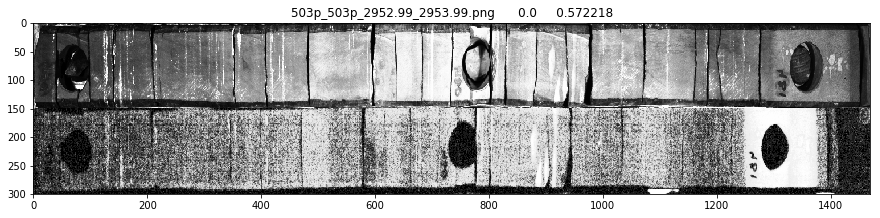

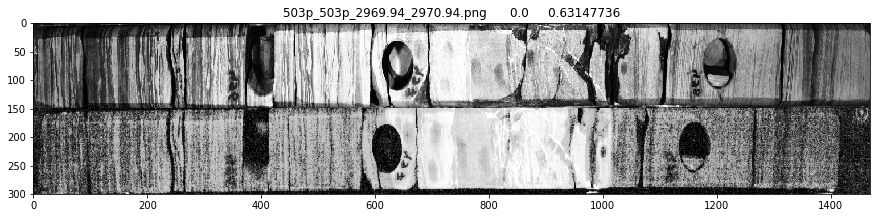

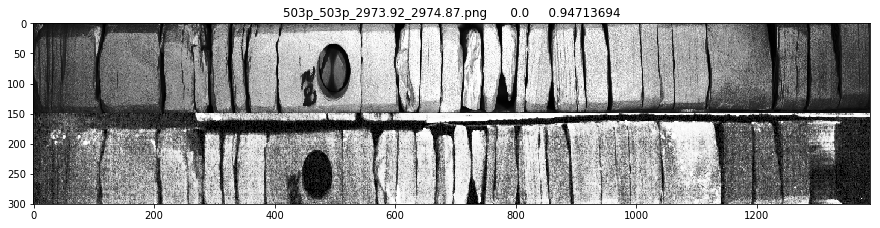

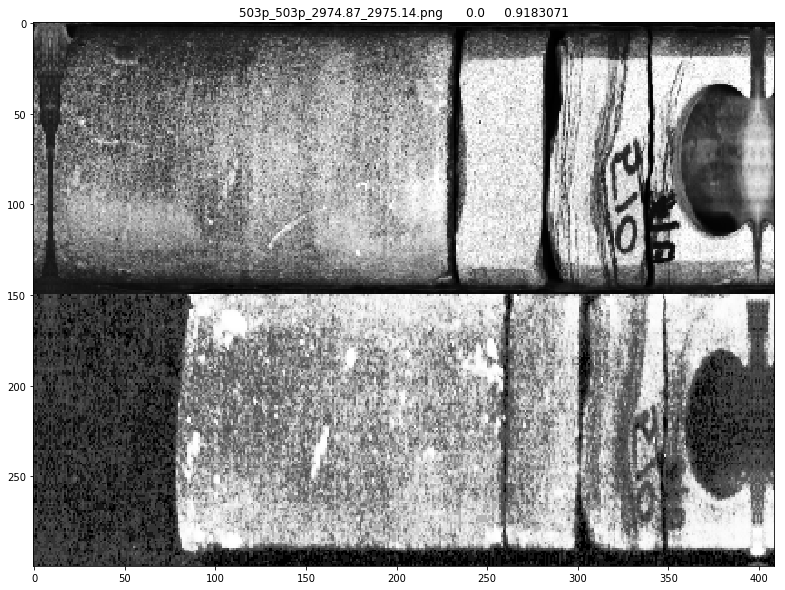

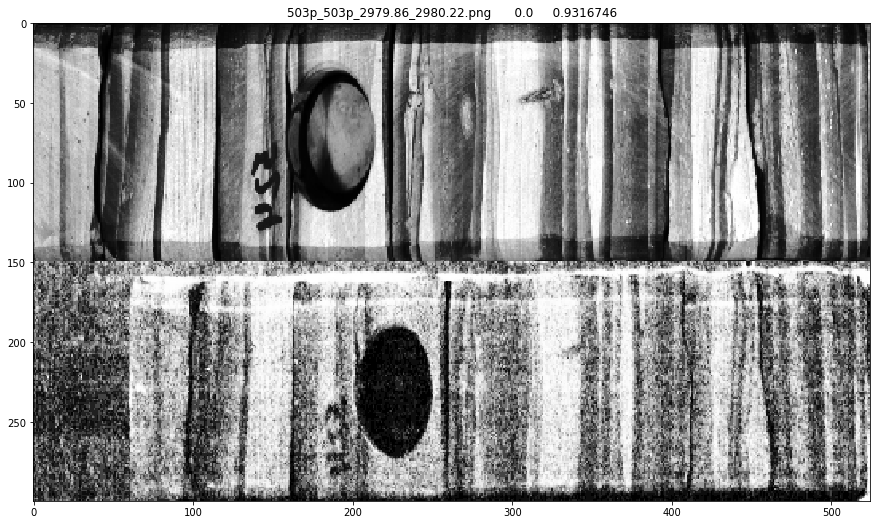

In [13]:
plot_images_predictions(test_ppl, 'fp', n_images=20)

# True positive

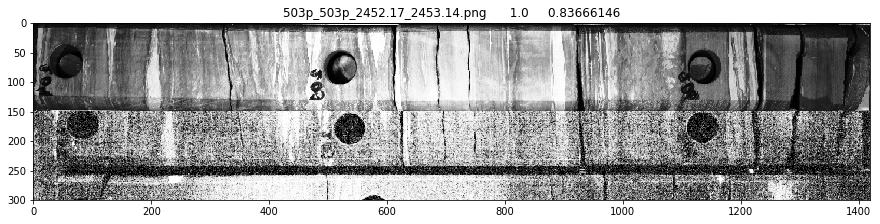

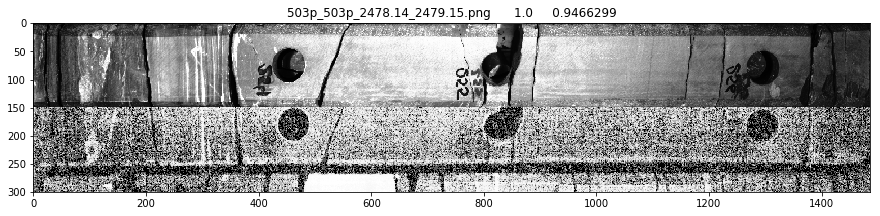

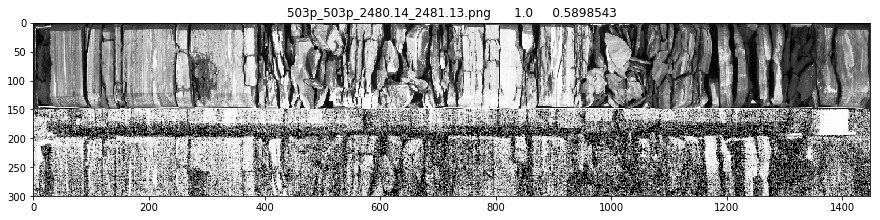

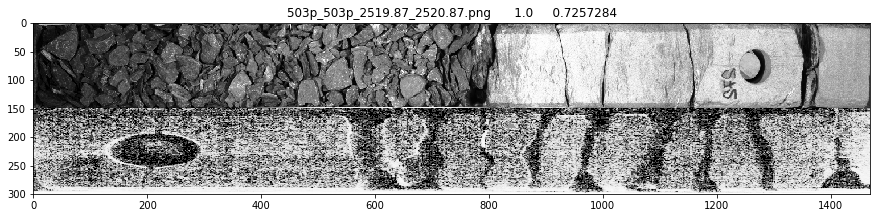

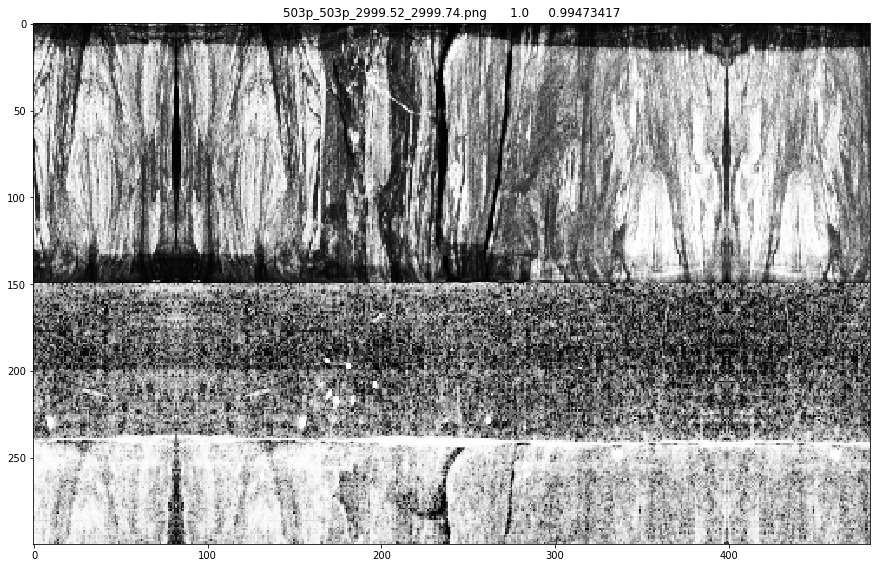

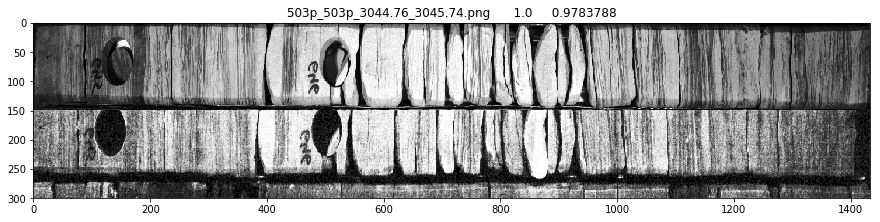

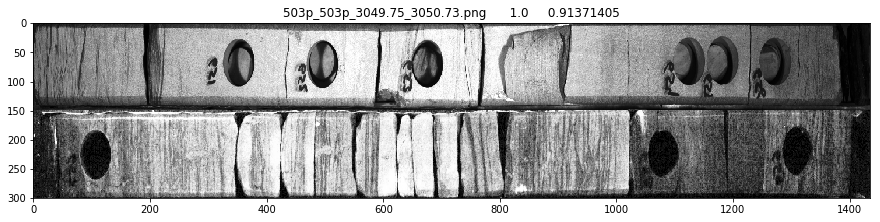

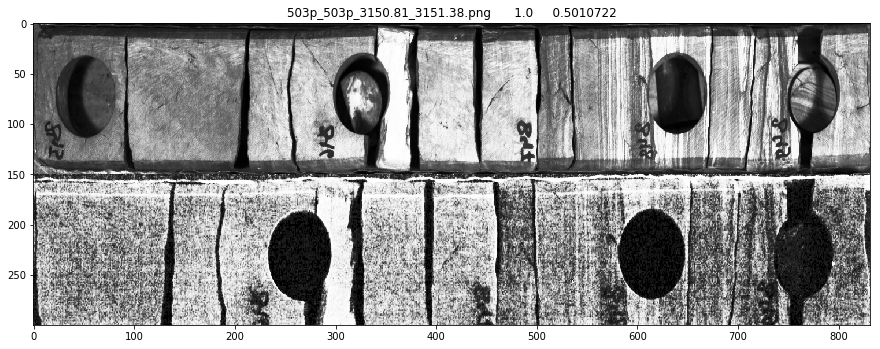

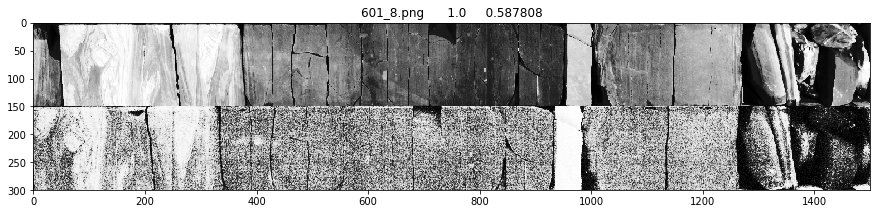

In [14]:
plot_images_predictions(test_ppl, 'tp')

# True negative

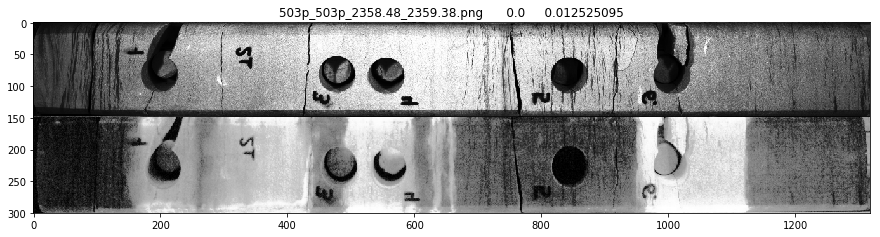

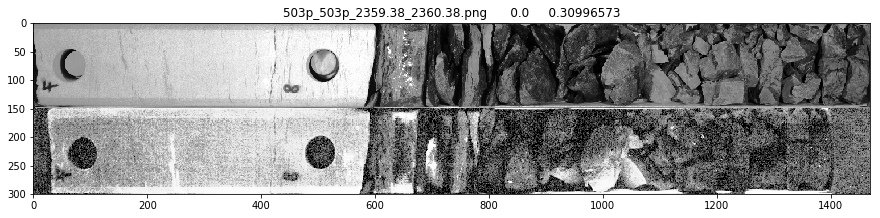

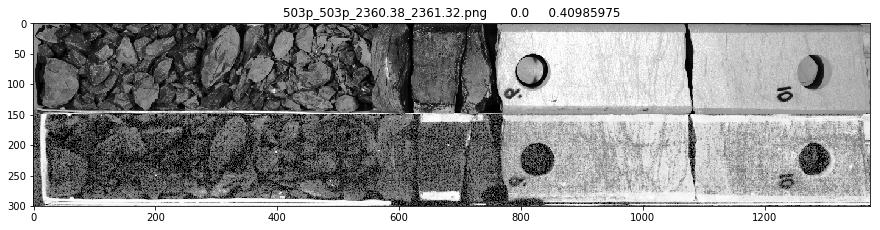

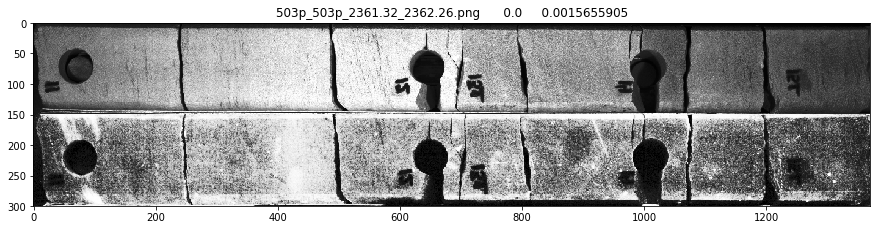

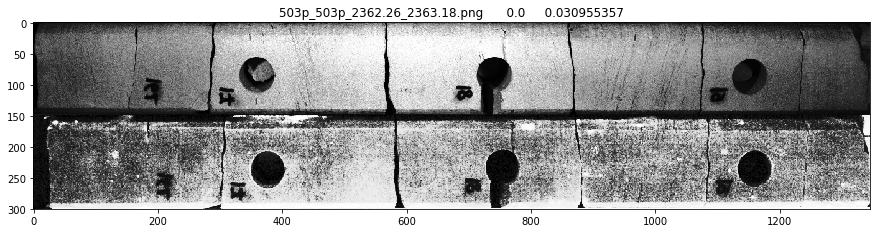

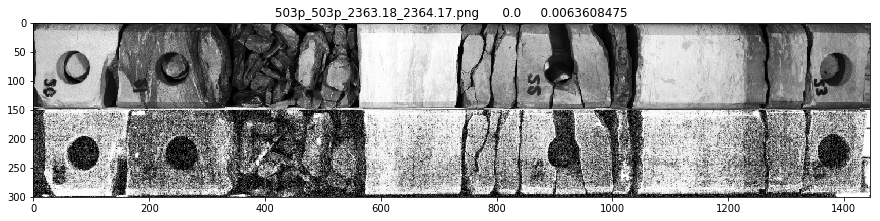

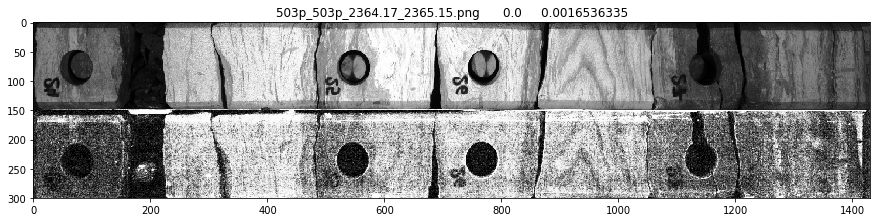

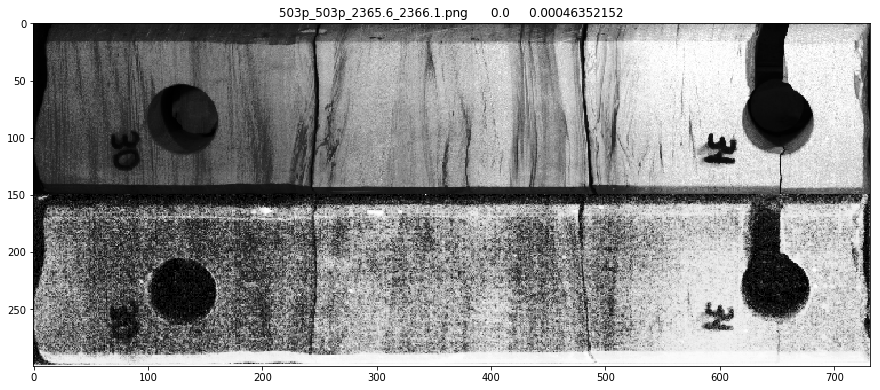

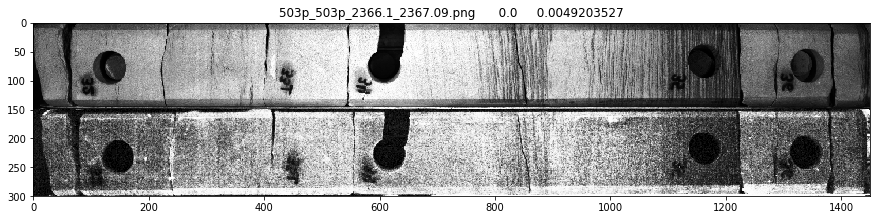

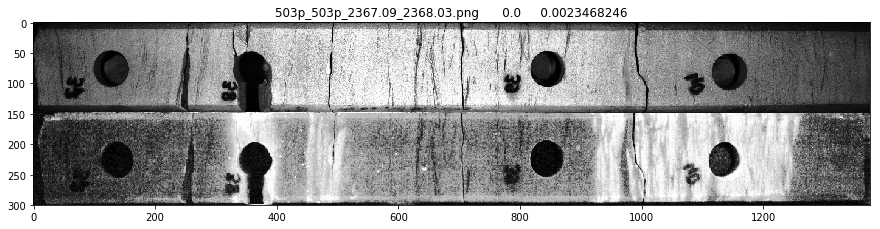

In [15]:
plot_images_predictions(test_ppl, 'tn', n_images=10)

# Вывод

Модель срабатывает в случаях, когда фотографии сдвинуты по вертикали относительно друг друга, а такие пары в разметке не относятся к бракованным.